<a href="https://colab.research.google.com/github/ArthAgrawal/SIH_Vegetable_Disease_Detection/blob/main/SIH_Potato_Disease_Classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [2]:
import os
folder_path = '/content/drive/My Drive/Potato_Diseases'
for filename in os.listdir(folder_path):
    print(filename)

Potato___healthy
Potato___Early_blight
Potato___Late_blight


In [3]:
import shutil
destination_path = '/content/Potato_Diseases'
shutil.copytree(folder_path, destination_path)

'/content/Potato_Diseases'

In [4]:
import os

folder_path = '/content/Potato_Diseases'

for subdir, dirs, files in os.walk(folder_path):
    if subdir != folder_path:
        print(f"Directory: {subdir}")
        print(f"Number of files: {len(files)}")
        print()


Directory: /content/Potato_Diseases/Potato___healthy
Number of files: 152

Directory: /content/Potato_Diseases/Potato___Late_blight
Number of files: 1000

Directory: /content/Potato_Diseases/Potato___Early_blight
Number of files: 1000



In [5]:
import os
import requests
from bs4 import BeautifulSoup
from urllib.parse import urljoin

def scrape_images(search_url, query, folder_name, num_images=50):
    # Creating the folder path for saving images
    folder_path = os.path.join(os.getcwd(), folder_name)

    # Creating the folder if it doesn't exist
    if not os.path.exists(folder_path):
        os.makedirs(folder_path)

    response = requests.get(search_url.format(query))
    soup = BeautifulSoup(response.text, 'html.parser')

    img_tags = soup.find_all('img')

    count = 0
    for img in img_tags:
        img_url = img.get('src')
        if img_url is None:
            continue
        img_url = urljoin(search_url, img_url)

        try:
            img_data = requests.get(img_url).content
            img_filename = os.path.join(folder_path, f'{folder_name}_{count}.jpg')
            with open(img_filename, 'wb') as img_file:
                img_file.write(img_data)

            count += 1
            if count >= num_images:
                break
        except Exception as e:
            print(f"Could not download {img_url}: {e}")

    print(f"Downloaded {count} images to {folder_path}")

# Defining the search URL and queries for each class
search_url = "https://www.google.com/search?q={}&source=lnms&tbm=isch"
queries = {
    'Potato__Early_blight_WebScraped': 'early blight in potato leaves',
    'Potato__Late_blight_WebScraped': 'late blight in potato leaves',
    'Potato__healthy_WebScraped': 'healthy potato leaves'
}

# Scraping images for each class
for class_name, query in queries.items():
    scrape_images(search_url, query, class_name, num_images=50)


Downloaded 21 images to /content/Potato__Early_blight_WebScraped
Downloaded 21 images to /content/Potato__Late_blight_WebScraped
Downloaded 21 images to /content/Potato__healthy_WebScraped


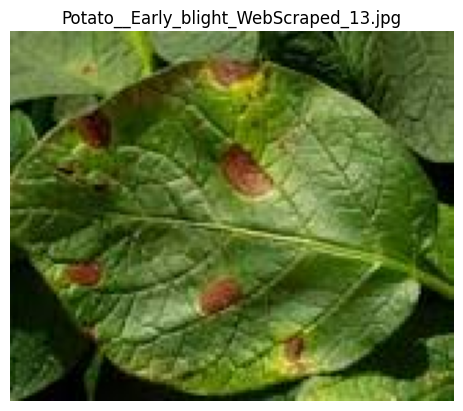

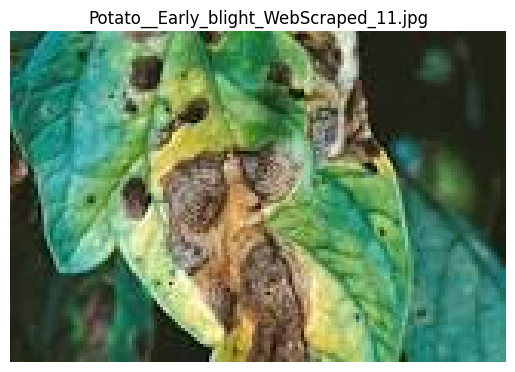

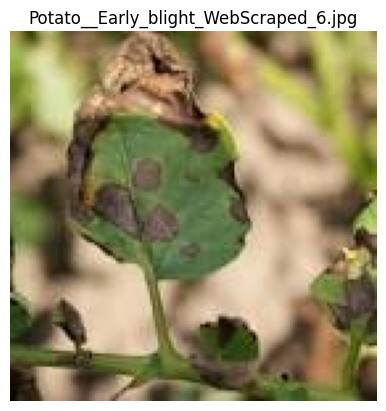

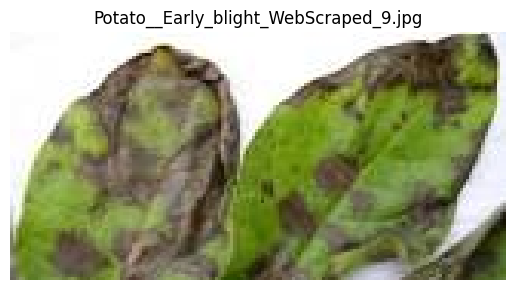

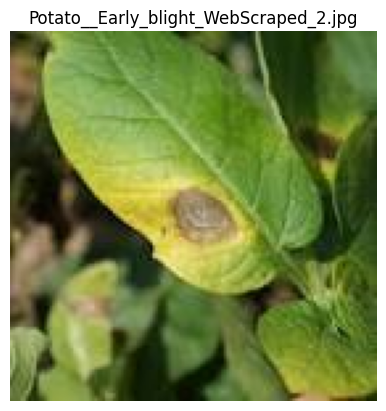

...

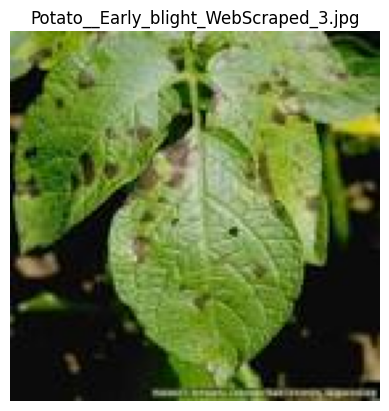

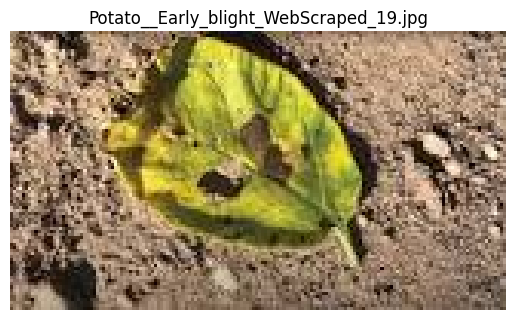

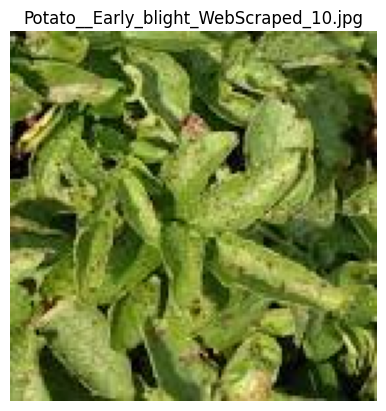

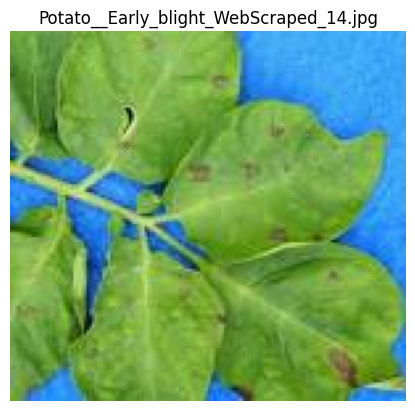

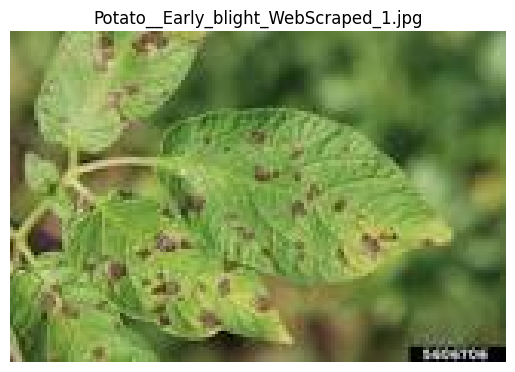

In [6]:
import os
from PIL import Image
import matplotlib.pyplot as plt

def display_images_from_folder(folder_path):
    files = os.listdir(folder_path)

    image_files = [file for file in files if file.lower().endswith(('png', 'jpg', 'jpeg', 'gif', 'bmp', 'tiff'))]

    for image_file in image_files:
        image_path = os.path.join(folder_path, image_file)
        try:
            img = Image.open(image_path)
            plt.imshow(img)
            plt.title(image_file)
            plt.axis('off')
            plt.show()
        except Exception as e:
            print(f"Could not display {image_file}: {e}")

folder_path = '/content/Potato__Early_blight_WebScraped'
display_images_from_folder(folder_path)


In [7]:
import os

def delete_images(folder_path, image_names_to_delete):
    for file_name in os.listdir(folder_path):
        if file_name in image_names_to_delete:
            file_path = os.path.join(folder_path, file_name)
            try:
                os.remove(file_path)
                print(f"Deleted: {file_path}")
            except Exception as e:
                print(f"Could not delete {file_path}: {e}")

folder_path = '/content/Potato__Early_blight_WebScraped'
image_names_to_delete = [
    'Potato__Early_blight_11.jpg',
    'Potato__Early_blight_7.jpg',
    'Potato__Early_blight_15.jpg',
    'Potato__Early_blight_5.jpg',
    'Potato__Early_blight_17.jpg',
    'Potato__Early_blight_20.jpg',
    'Potato__Early_blight_0.jpg',
    'Potato__Early_blight_14.jpg',
    'Potato__Early_blight_9.jpg',
]

delete_images(folder_path, image_names_to_delete)


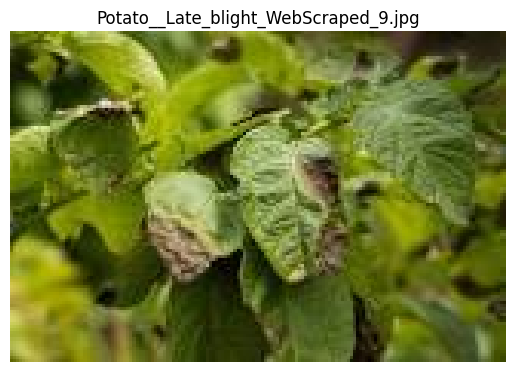

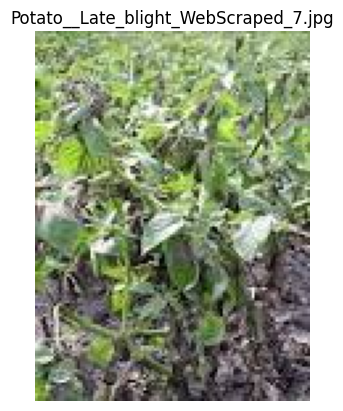

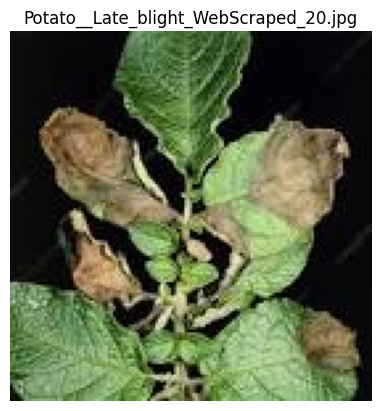

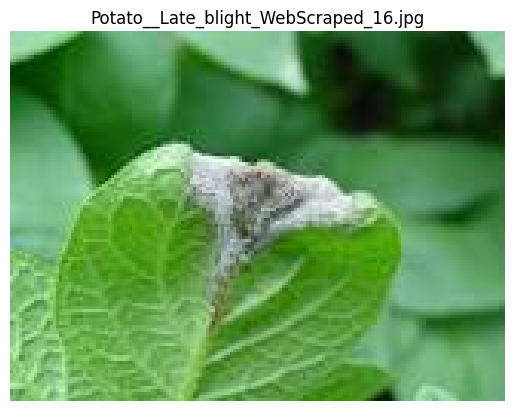

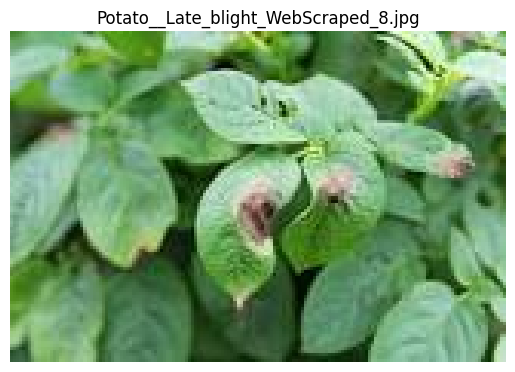

...

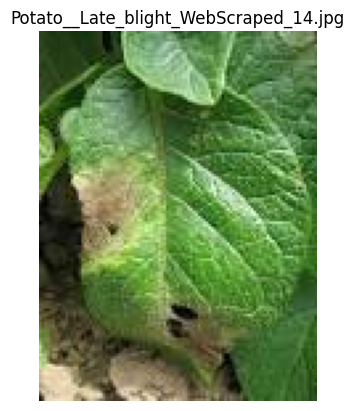

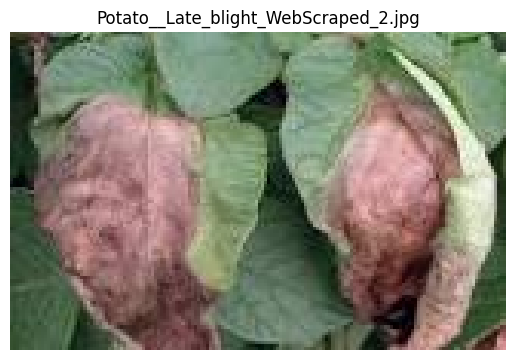

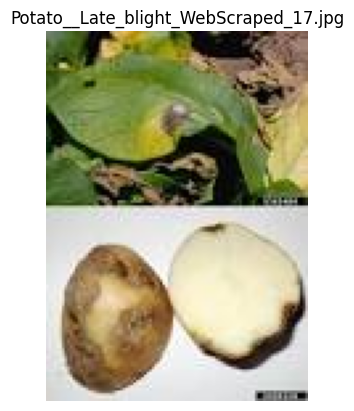

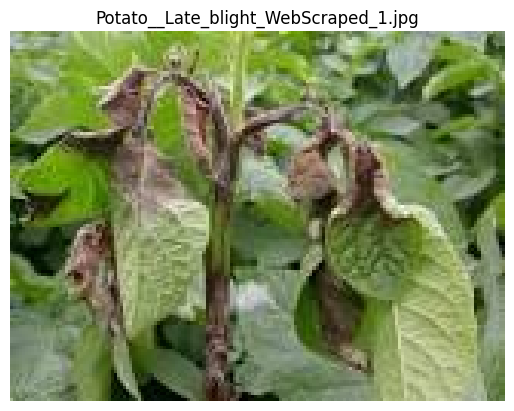

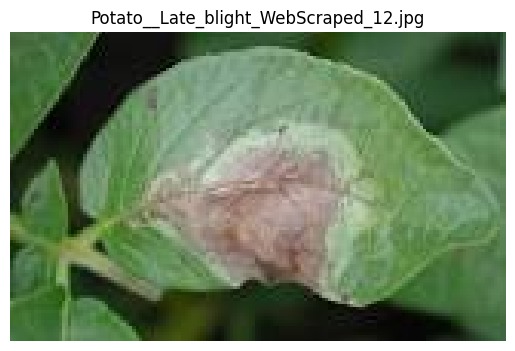

In [8]:
import os
from PIL import Image
import matplotlib.pyplot as plt

def display_images_from_folder(folder_path):
    files = os.listdir(folder_path)

    image_files = [file for file in files if file.lower().endswith(('png', 'jpg', 'jpeg', 'gif', 'bmp', 'tiff'))]

    for image_file in image_files:
        image_path = os.path.join(folder_path, image_file)
        try:
            img = Image.open(image_path)
            plt.imshow(img)
            plt.title(image_file)
            plt.axis('off')
            plt.show()
        except Exception as e:
            print(f"Could not display {image_file}: {e}")

folder_path = '/content/Potato__Late_blight_WebScraped'
display_images_from_folder(folder_path)


In [9]:
import os

def delete_images(folder_path, image_names_to_delete):
    for file_name in os.listdir(folder_path):
        if file_name in image_names_to_delete:
            file_path = os.path.join(folder_path, file_name)
            try:
                os.remove(file_path)
                print(f"Deleted: {file_path}")
            except Exception as e:
                print(f"Could not delete {file_path}: {e}")

folder_path = '/content/Potato__Early_blight_WebScraped'
image_names_to_delete = [
    'Potato__Early_blight_0.jpg',
    'Potato__Early_blight_17.jpg',
    'Potato__Early_blight_12.jpg',
    'Potato__Early_blight_14.jpg',
    'Potato__Early_blight_16.jpg',
    'Potato__Early_blight_18.jpg',
    'Potato__Early_blight_6.jpg',
    'Potato__Early_blight_1.jpg',
]

delete_images(folder_path, image_names_to_delete)


In [10]:
import shutil
import os

def delete_folder(folder_path):
    if os.path.exists(folder_path):
        try:
            shutil.rmtree(folder_path)
            print(f"Deleted folder: {folder_path}")
        except Exception as e:
            print(f"Could not delete folder {folder_path}: {e}")
    else:
        print(f"Folder does not exist: {folder_path}")

folder_path = '/content/Potato__healthy_WebScraped'
delete_folder(folder_path)


Deleted folder: /content/Potato__healthy_WebScraped


In [12]:
import os
import shutil

def move_files(src_folder, dest_folder):
    if not os.path.exists(dest_folder):
        os.makedirs(dest_folder)

    for filename in os.listdir(src_folder):
        src_file = os.path.join(src_folder, filename)
        dest_file = os.path.join(dest_folder, filename)

        try:
            if os.path.isfile(src_file):
                shutil.move(src_file, dest_file)
                print(f"Moved {filename} from {src_folder} to {dest_folder}")
        except Exception as e:
            print(f"Could not move {filename}: {e}")

src_folders = {
    'Potato__Early_blight_WebScraped': 'Potato___Early_blight',
    'Potato__Late_blight_WebScraped': 'Potato___Late_blight'
}

base_dir = '/content/Potato_Diseases'

for src_name, dest_name in src_folders.items():
    src_path = os.path.join(base_dir, src_name)
    dest_path = os.path.join(base_dir, dest_name)
    move_files(src_path, dest_path)


Moved Potato__Early_blight_WebScraped_13.jpg from /content/Potato_Diseases/Potato__Early_blight_WebScraped to /content/Potato_Diseases/Potato___Early_blight
Moved Potato__Early_blight_WebScraped_11.jpg from /content/Potato_Diseases/Potato__Early_blight_WebScraped to /content/Potato_Diseases/Potato___Early_blight
Moved Potato__Early_blight_WebScraped_6.jpg from /content/Potato_Diseases/Potato__Early_blight_WebScraped to /content/Potato_Diseases/Potato___Early_blight
Moved Potato__Early_blight_WebScraped_9.jpg from /content/Potato_Diseases/Potato__Early_blight_WebScraped to /content/Potato_Diseases/Potato___Early_blight
Moved Potato__Early_blight_WebScraped_2.jpg from /content/Potato_Diseases/Potato__Early_blight_WebScraped to /content/Potato_Diseases/Potato___Early_blight
Moved Potato__Early_blight_WebScraped_5.jpg from /content/Potato_Diseases/Potato__Early_blight_WebScraped to /content/Potato_Diseases/Potato___Early_blight
Moved Potato__Early_blight_WebScraped_20.jpg from /content/Pot

In [13]:
import os

folder_path = '/content/Potato_Diseases'

for subdir, dirs, files in os.walk(folder_path):
    if subdir != folder_path:
        print(f"Directory: {subdir}")
        print(f"Number of files: {len(files)}")
        print()


Directory: /content/Potato_Diseases/Potato___healthy
Number of files: 152

Directory: /content/Potato_Diseases/Potato__Late_blight_WebScraped
Number of files: 0

Directory: /content/Potato_Diseases/Potato__Early_blight_WebScraped
Number of files: 0

Directory: /content/Potato_Diseases/Potato___Late_blight
Number of files: 1021

Directory: /content/Potato_Diseases/Potato___Early_blight
Number of files: 1021



In [14]:
import tensorflow as tf
(train_images, train_labels), (test_images, test_labels) = tf.keras.datasets.cifar10.load_data()


170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


In [15]:
import numpy as np
import os
import tensorflow as tf

# Loading the CIFAR-10 dataset
(train_images, train_labels), (test_images, test_labels) = tf.keras.datasets.cifar10.load_data()

save_path = '/content/cifar10'

if not os.path.exists(save_path):
    os.makedirs(save_path)

np.save(os.path.join(save_path, 'train_images.npy'), train_images)
np.save(os.path.join(save_path, 'train_labels.npy'), train_labels)
np.save(os.path.join(save_path, 'test_images.npy'), test_images)
np.save(os.path.join(save_path, 'test_labels.npy'), test_labels)

print("CIFAR-10 dataset saved successfully.")


CIFAR-10 dataset saved successfully.


In [16]:
import numpy as np
import tensorflow as tf
import os
from PIL import Image

# Loading CIFAR-10 dataset
(train_images, _), (test_images, _) = tf.keras.datasets.cifar10.load_data()

# Combining train and test images
all_images = np.concatenate([train_images, test_images])

# Randomly sampling 1000 images from all images
num_images = 1000  # Desired number of images
indices = np.random.choice(len(all_images), num_images, replace=False)
subset_images = all_images[indices]

save_dir = '/content/cifar10_subset'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

def save_images(images, directory):
    for i, img_array in enumerate(images):
        img = Image.fromarray(img_array)
        img.save(os.path.join(directory, f'image_{i}.png'))
        if i % 100 == 0:
            print(f"Saved {i} images.")

save_images(subset_images, save_dir)

print(f"Subset of CIFAR-10 images have been saved to {save_dir}.")


Saved 0 images.
Saved 100 images.
Saved 200 images.
Saved 300 images.
Saved 400 images.
Saved 500 images.
Saved 600 images.
Saved 700 images.
Saved 800 images.
Saved 900 images.
Subset of CIFAR-10 images have been saved to /content/cifar10_subset.


In [17]:
import shutil
import os

src_path = '/content/cifar10_subset'
dest_path = '/content/Potato_Diseases/ODD(Cifar10_Subset)'


if not os.path.exists(dest_path):
    shutil.move(src_path, dest_path)
    print(f"Moved and renamed {src_path} to {dest_path}.")
else:
    print(f"Destination directory {dest_path} already exists.")


Moved and renamed /content/cifar10_subset to /content/Potato_Diseases/ODD(Cifar10_Subset).


In [18]:
import os

folder_path = '/content/Potato_Diseases'

for subdir, dirs, files in os.walk(folder_path):
    if subdir != folder_path:
        print(f"Directory: {subdir}")
        print(f"Number of files: {len(files)}")
        print()


Directory: /content/Potato_Diseases/Potato___healthy
Number of files: 152

Directory: /content/Potato_Diseases/Potato__Late_blight_WebScraped
Number of files: 0

Directory: /content/Potato_Diseases/Potato__Early_blight_WebScraped
Number of files: 0

Directory: /content/Potato_Diseases/ODD(Cifar10_Subset)
Number of files: 1000

Directory: /content/Potato_Diseases/Potato___Late_blight
Number of files: 1021

Directory: /content/Potato_Diseases/Potato___Early_blight
Number of files: 1021



In [19]:
from PIL import Image
import os

def resize_images(directory, target_size):
    for filename in os.listdir(directory):
        if filename.endswith('.png') or filename.endswith('.jpg'):
            filepath = os.path.join(directory, filename)
            with Image.open(filepath) as img:
                # Resize image
                resized_img = img.resize(target_size)
                # Save resized image
                resized_img.save(filepath)  # Overwrite the existing image or save as a new file

# Define the path and target size
odds_directory = '/content/Potato_Diseases/ODD(Cifar10_Subset)'
target_size = (256, 256)

resize_images(odds_directory, target_size)


In [20]:
import tensorflow as tf
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt

In [21]:
IMAGE_SIZE = 256
BATCH_SIZE = 32
CHANNELS = 3
EPOCHS = 35


In [23]:
import tensorflow as tf
potato_path = '/content/Potato_Diseases'

dataset = tf.keras.preprocessing.image_dataset_from_directory(
    potato_path,
    shuffle=True,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=BATCH_SIZE
)
class_names = dataset.class_names
print(f"Class names: {class_names}")
print(f"Number of batches: {len(dataset)}")


Found 3194 files belonging to 4 classes.
Class names: ['ODD(Cifar10_Subset)', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']
Number of batches: 100


In [24]:
len(dataset)

100

In [25]:
for image_batch, label_batch in dataset.take(1):
    print(image_batch.shape)
    print(label_batch.numpy())

(32, 256, 256, 3)
[1 2 1 2 1 0 2 2 2 0 0 0 2 2 1 0 0 1 2 0 2 0 0 0 0 1 1 0 2 2 3 0]


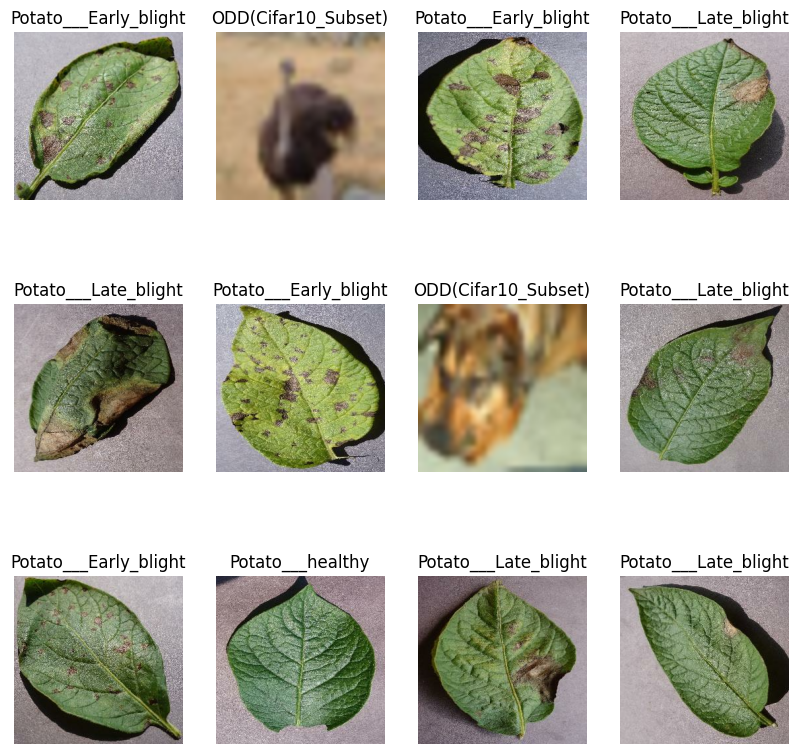

In [24]:
plt.figure(figsize=(10, 10))
for image_batch, label_batch in dataset.take(1):
  for i in range (12):
    ax = plt.subplot(3, 4, i + 1)
    plt.imshow(image_batch[i].numpy().astype("uint8"))
    plt.title(class_names[label_batch[i]])
    plt.axis("off")

In [26]:
import tensorflow as tf

dataset = tf.keras.preprocessing.image_dataset_from_directory(
    potato_path,
    shuffle=True,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

# Get the total number of batches
dataset_size = len(dataset)

# Define split ratios
train_size = int(dataset_size * 0.8)
val_size = int(dataset_size * 0.1)
test_size = dataset_size - train_size - val_size

# Creating train, validation, and test datasets
train_ds = dataset.take(train_size)
val_ds = dataset.skip(train_size).take(val_size)
test_ds = dataset.skip(train_size + val_size)


Found 3194 files belonging to 4 classes.


In [27]:
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.cache().prefetch(buffer_size=tf.data.AUTOTUNE)


In [28]:
print(len(train_ds))
print(len(val_ds))
print(len(test_ds))

80
10
10


In [29]:
resize_and_rescale = tf.keras.Sequential([
  layers.Resizing(IMAGE_SIZE, IMAGE_SIZE),
  layers.Rescaling(1./255),
])

In [30]:
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal_and_vertical"),
    layers.RandomRotation(0.2),
    layers.RandomCrop(height=IMAGE_SIZE, width=IMAGE_SIZE),
    layers.RandomBrightness(0.2),
    layers.RandomContrast(0.2),
    layers.RandomZoom(0.2),
    layers.RandomTranslation(height_factor=0.2, width_factor=0.2),
])

train_ds = train_ds.map(
    lambda x, y: (data_augmentation(x, training=True), y)
).prefetch(buffer_size=tf.data.AUTOTUNE)


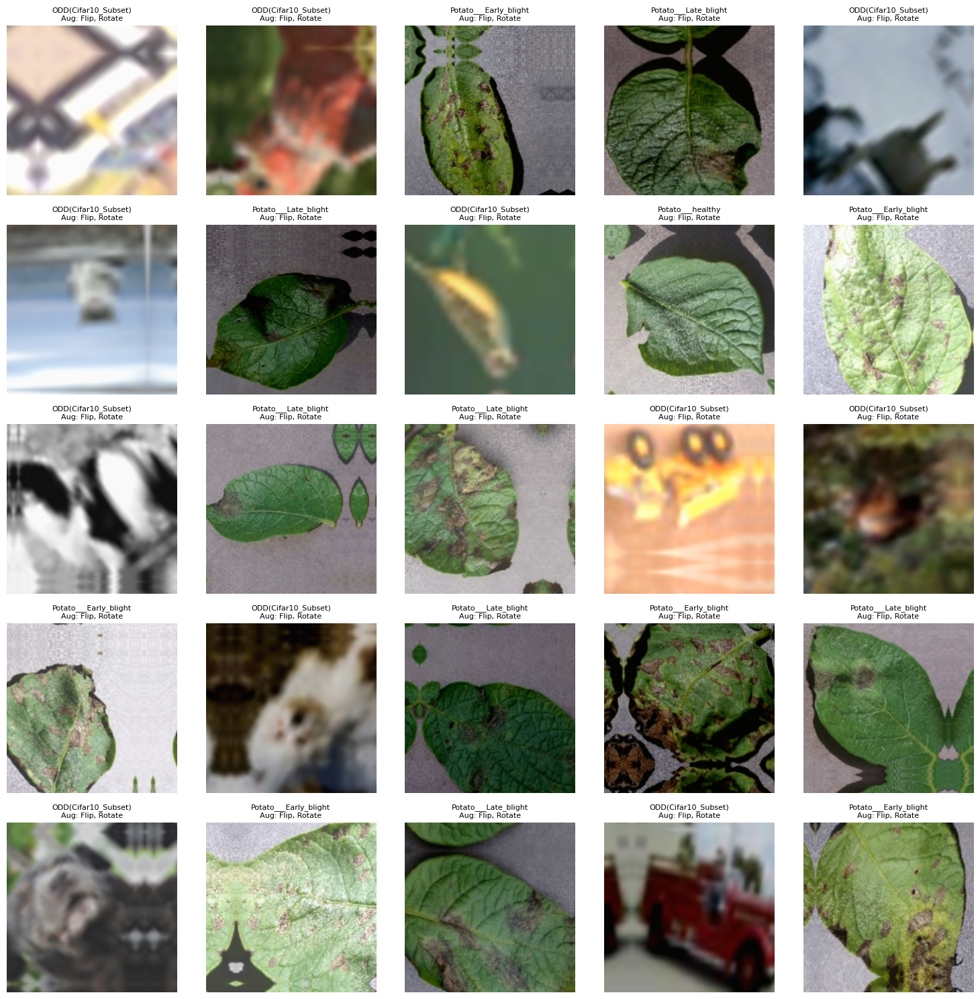

In [31]:
import matplotlib.pyplot as plt
import numpy as np

def show_images(images, labels, class_names, augmentations, num_images=25):
    plt.figure(figsize=(15, 15))
    num_rows = int(np.ceil(num_images / 5))
    num_cols = min(num_images, 5)

    for i in range(min(num_images, len(images))):
        plt.subplot(num_rows, num_cols, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        title = f"{class_names[labels[i].numpy()]}"
        if augmentations is not None:
            title += f"\nAug: {augmentations[i]}"
        plt.title(title, fontsize=8)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

def get_augmentation_labels(batch_size):
    return ["Flip, Rotate"] * batch_size

image_batch, label_batch = next(iter(train_ds))

augmentation_labels = get_augmentation_labels(len(image_batch))

show_images(image_batch, label_batch, class_names, augmentation_labels)


In [32]:
import shutil
import os

def delete_folder(folder_path):
    if os.path.exists(folder_path):
        try:
            shutil.rmtree(folder_path)
            print(f"Deleted folder: {folder_path}")
        except Exception as e:
            print(f"Could not delete folder {folder_path}: {e}")
    else:
        print(f"Folder does not exist: {folder_path}")

folder_path = '/content/cifar10'
delete_folder(folder_path)


Deleted folder: /content/cifar10


In [33]:
import tensorflow as tf
from tensorflow.keras import layers, models

n_classes = 4

input_shape = (IMAGE_SIZE, IMAGE_SIZE, CHANNELS)

model = models.Sequential([
    resize_and_rescale,
    layers.Conv2D(32, kernel_size=(3,3), activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, kernel_size=(3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, kernel_size=(3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(n_classes, activation='softmax'),
])

model.build(input_shape=(None, IMAGE_SIZE, IMAGE_SIZE, CHANNELS))


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [34]:
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ sequential (Sequential)              │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 254, 254, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 127, 127, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 125, 125, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 62, 62, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 60, 60, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 28, 28, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 14, 14, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 12544)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 64)                  │         802,880 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 4)                   │             260 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 896,388 (3.42 MB)

 Trainable params: 896,388 (3.42 MB)

 Non-trainable params: 0 (0.00 B)

In [36]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
model.compile(
    optimizer=optimizer,
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)


In [37]:
from tqdm.keras import TqdmCallback
tqdm_callback = TqdmCallback()
history = model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    epochs=EPOCHS,
    callbacks=[tqdm_callback],
    verbose=1
)

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 1/35
80/80 ━━━━━━━━━━━━━━━━━━━━ 83s 919ms/step - accuracy: 0.4953 - loss: 1.0936 - val_accuracy: 0.7219 - val_loss: 0.5778
Epoch 2/35
80/80 ━━━━━━━━━━━━━━━━━━━━ 64s 797ms/step - accuracy: 0.7792 - loss: 0.6144 - val_accuracy: 0.7125 - val_loss: 0.7009
Epoch 3/35
80/80 ━━━━━━━━━━━━━━━━━━━━ 63s 781ms/step - accuracy: 0.8124 - loss: 0.5469 - val_accuracy: 0.6438 - val_loss: 1.5940
Epoch 4/35
80/80 ━━━━━━━━━━━━━━━━━━━━ 64s 804ms/step - accuracy: 0.8290 - loss: 0.4597 - val_accuracy: 0.7094 - val_loss: 1.1570
Epoch 5/35
80/80 ━━━━━━━━━━━━━━━━━━━━ 62s 775ms/step - accuracy: 0.8348 - loss: 0.4382 - val_accuracy: 0.7375 - val_loss: 0.8182
Epoch 6/35
80/80 ━━━━━━━━━━━━━━━━━━━━ 64s 791ms/step - accuracy: 0.8669 - loss: 0.3427 - val_accuracy: 0.8313 - val_loss: 0.4585
Epoch 7/35
80/80 ━━━━━━━━━━━━━━━━━━━━ 61s 766ms/step - accuracy: 0.8881 - loss: 0.3101 - val_accuracy: 0.7281 - val_loss: 1.0753
Epoch 8/35
80/80 ━━━━━━━━━━━━━━━━━━━━ 64s 791ms/step - accuracy: 0.8930 - loss: 0.2725 - val_accu

In [38]:
scores = model.evaluate(test_ds)

10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 278ms/step - accuracy: 0.9580 - loss: 0.1464


In [39]:
scores

[0.10622794926166534, 0.9649681448936462]

In [40]:
history

In [41]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

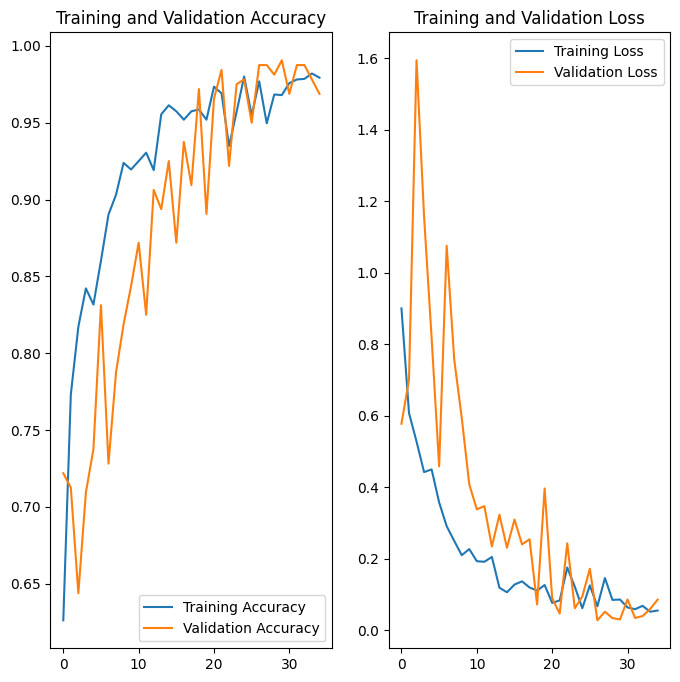

In [42]:
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

first image to predict
actual label: Potato___Late_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step
predicted label: Potato___Late_blight


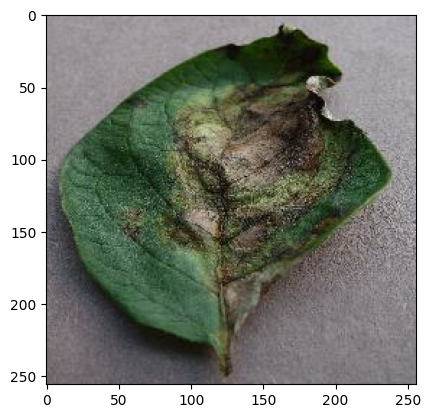

In [43]:
import numpy as np
for images_batch, labels_batch in test_ds.take(1):

    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()

    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",class_names[first_label])

    batch_prediction = model.predict(images_batch)
    print("predicted label:",class_names[np.argmax(batch_prediction[0])])

In [44]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 809ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


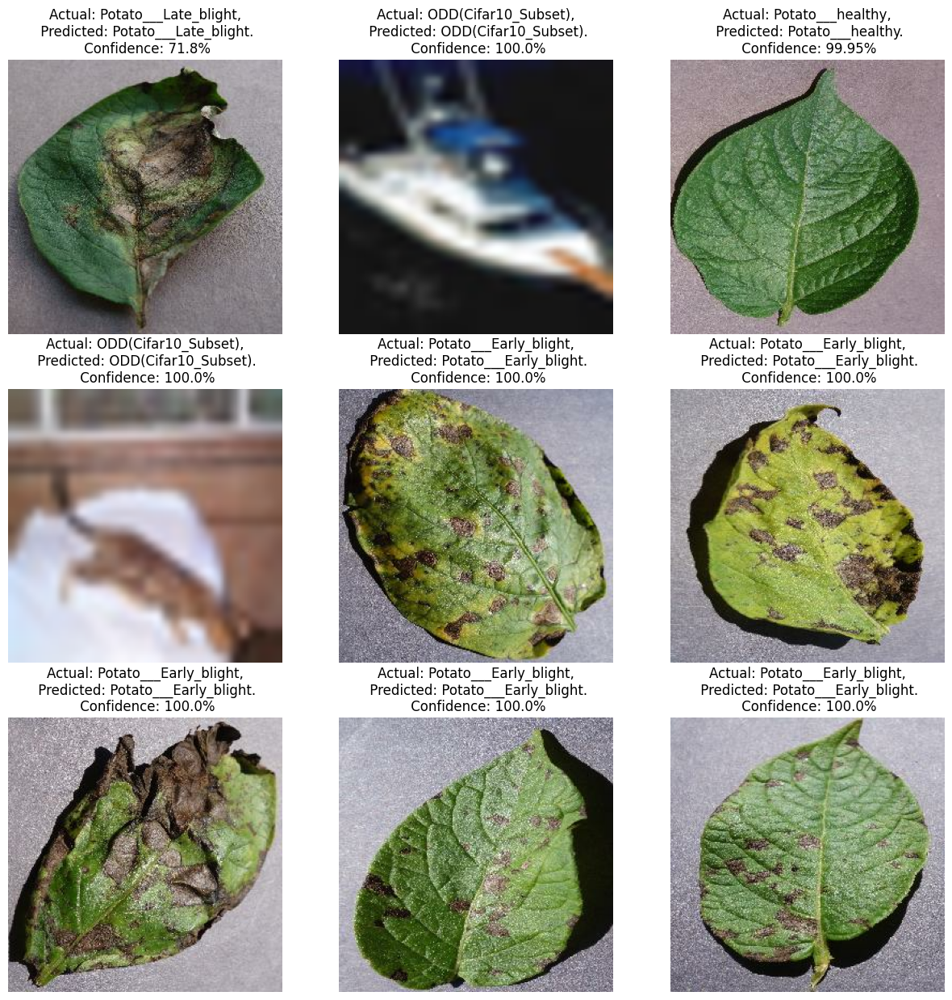

In [45]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))

        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]]

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")

        plt.axis("off")

In [46]:
from google.colab import drive
import os

drive.mount('/content/drive')

model_dir = '/content/drive/MyDrive/models'
if not os.path.exists(model_dir):
    os.makedirs(model_dir)

model_name = 'potato_model_v1.h5'

model.save(os.path.join(model_dir, model_name))


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
